Aim of this notebook is to look at calibrated stereo images and to visualize some mathematical properties of pairs of matched keypoints, found by opencv sift algorithms or our pysift implementation.


Imports


In [38]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
import os
import sys

# add the path to the visualize_hessian folder
sys.path.append(os.path.join("..", "visualize_hessian"))

import visu_hessian as vh

# return to the root directory
sys.path.append(os.path.join(".."))

# add the path to the visualize_hessian folder
sys.path.append(os.path.join("..", "descriptor"))

import descriptor.descriptor as desc
import descriptor.visu_descriptor as visu_desc

# return to the root directory
sys.path.append(os.path.join(".."))

# Load grayscale image


In [61]:
img_folder = "../data/irl/scene_zipped"
im_name1 = "scene_l_1_u"
im_name2 = "scene_r_1_u"
im_names = [im_name1, im_name2]
im_ext = "jpeg"

ims = [
    cv.imread(f"{img_folder}/{im_names[i]}.{im_ext}", cv.IMREAD_GRAYSCALE)
    for i in range(2)
]

## Crop objects


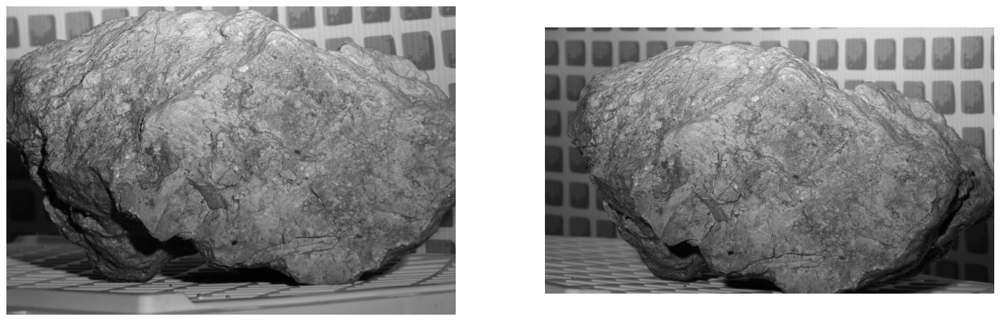

In [62]:
croppings = [slice(500, 1400), slice(900, 2210), slice(670, 1560), slice(1000, 2500)]
ims[0] = ims[0][croppings[0], croppings[1]]
ims[1] = ims[1][croppings[2], croppings[3]]

plt.figure(figsize=(20, 10))
plt.subplot(1, 2, 1)
plt.imshow(ims[0], cmap="gray")
plt.axis("off")
plt.subplot(1, 2, 2)
plt.imshow(ims[1], cmap="gray")
plt.axis("off")
plt.show()

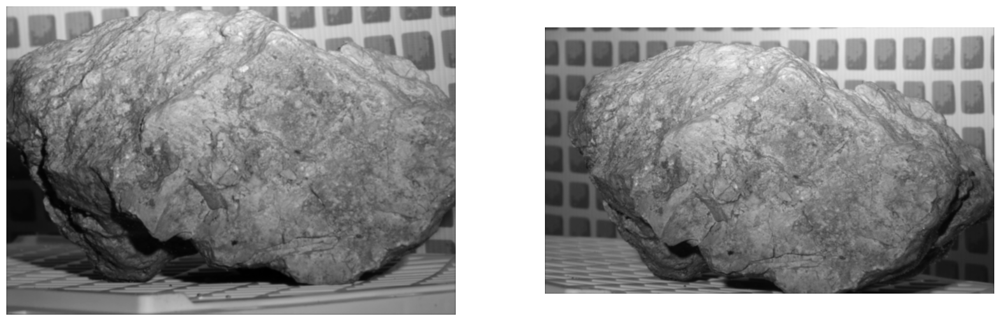

Image 1 min: 0.02978413480491738
Image 1 max: 0.8521827807314558
Image 1 mean: 0.4145530178661809
Image 1 std: 0.15333305216812412
Image 1 shape: (900, 1310)
Image 1 dtype: float64
Image 1 size: 1179000

Image 2 min: 0.03997189277167523
Image 2 max: 0.8512944742772461
Image 2 mean: 0.4259450440129061
Image 2 std: 0.1565636197366428
Image 2 shape: (890, 1500)
Image 2 dtype: float64
Image 2 size: 1335000



In [63]:
# compute float32 versions for calculations
float_ims = [vh.convert_uint8_to_float32(ims[i]) for i in range(2)]

# blur images
float_ims = [float_ims[0], float_ims[1]]
blur_sigma = 1.6
float_ims = [desc.convolve_2D_gaussian(float_ims[i], blur_sigma) for i in range(2)]

float_ims[0], float_ims[1] = float_ims

# compute min and max values for normalization
min_val = min(float_ims[0].min(), float_ims[1].min())
max_val = max(float_ims[0].max(), float_ims[1].max())
min_vals, max_vals = [min_val, min_val], [max_val, max_val]

plt.figure(figsize=(20, 10))
plt.subplot(1, 2, 1)
plt.imshow(float_ims[0], cmap="gray", vmin=min_val, vmax=max_val)
plt.axis("off")
plt.subplot(1, 2, 2)
plt.imshow(float_ims[1], cmap="gray", vmin=min_val, vmax=max_val)
plt.axis("off")
plt.show()

# print extrema values
for i, im in enumerate(float_ims):
    print(f"Image {i+1} min: {im.min()}")
    print(f"Image {i+1} max: {im.max()}")
    print(f"Image {i+1} mean: {im.mean()}")
    print(f"Image {i+1} std: {im.std()}")
    print(f"Image {i+1} shape: {im.shape}")
    print(f"Image {i+1} dtype: {im.dtype}")
    print(f"Image {i+1} size: {im.size}")
    print("")

# Match SIFT Keypoints on stereo setup


In [64]:
# Initiate SIFT detector
sift = cv.SIFT_create()

# find the keypoints and descriptors with SIFT
kp1, des1 = sift.detectAndCompute(ims[0], None)
kp2, des2 = sift.detectAndCompute(ims[1], None)

# print number of keypoints detected in each image
print(f"Number of keypoints detected in {im_name1}: {len(kp1)}")
print(f"Number of keypoints detected in {im_name2}: {len(kp2)}")

Number of keypoints detected in scene_l_1_u: 7366
Number of keypoints detected in scene_r_1_u: 6956


In [65]:
# BFMatcher with default params
# default norm is L2
bf = cv.BFMatcher()
matches = bf.knnMatch(des1, des2, k=2)

# Apply Lowe's ratio test
threshold = 0.75
good = []
for m, n in matches:
    if m.distance < threshold * n.distance:
        good.append([m])

# Alternative: crossCheck=True
bf_CC = cv.BFMatcher(crossCheck=True)
matches_CC = bf_CC.match(des1, des2)

# Sort them in the order of their distance.
good_sorted = sorted(good, key=lambda x: x[0].distance)
matches_CC_sorted = sorted(matches_CC, key=lambda x: x.distance)

# print the distances
print("Distances with Lowe's ratio:")
for m in good_sorted[:10]:
    print(f"{m[0].distance:.2f}", end=" ")

print("\nDistances with crossCheck:")
for m in matches_CC_sorted[:10]:
    print(f"{m.distance:.2f}", end=" ")

Distances with Lowe's ratio:
31.11 33.81 35.14 35.71 38.57 41.36 42.77 45.35 46.20 46.68 
Distances with crossCheck:
31.11 33.81 35.14 35.71 38.57 41.36 42.77 45.35 46.20 46.68 

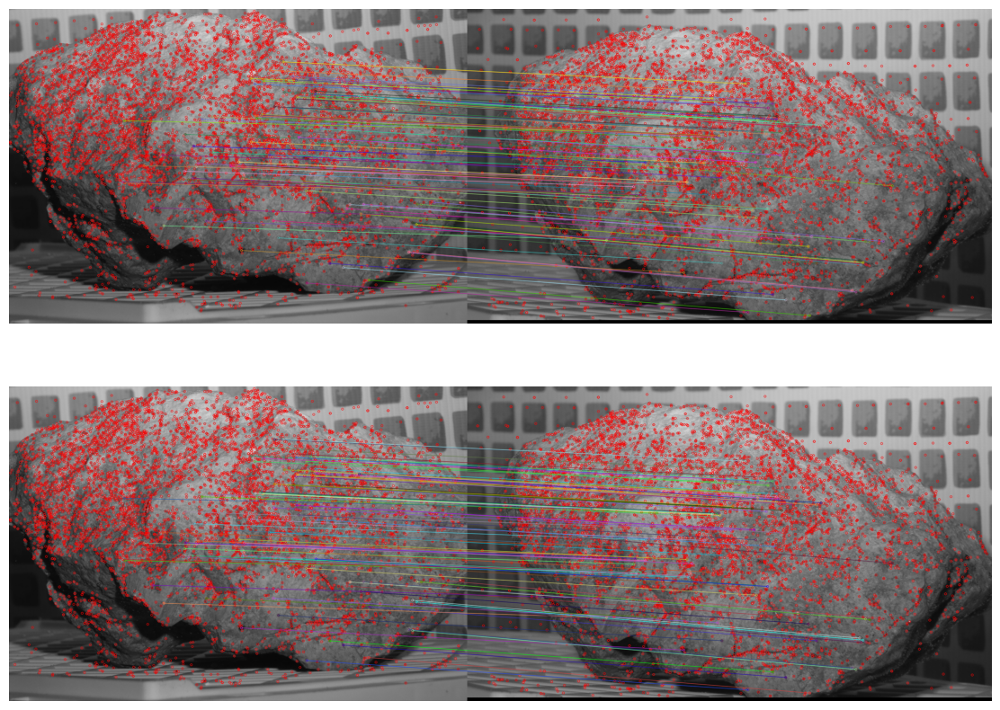

In [66]:
# %%script false
# cv.drawMatchesKnn expects list of lists as matches.
nb_matches_to_draw = 100

img3 = cv.drawMatchesKnn(
    ims[0],
    kp1,
    ims[1],
    kp2,
    good_sorted[:nb_matches_to_draw],
    outImg=None,
    singlePointColor=(255, 0, 0),
)
img4 = cv.drawMatches(
    ims[0],
    kp1,
    ims[1],
    kp2,
    matches_CC_sorted[:nb_matches_to_draw],
    singlePointColor=(255, 0, 0),
    outImg=None,
)

plt.figure(figsize=(30, 10))
plt.subplot(2, 1, 1)
plt.imshow(img3)
plt.axis("off")
plt.subplot(2, 1, 2)
plt.imshow(img4)
plt.axis("off")
plt.show()

# Visualize gradients and curvatures


In [67]:
# store keypoints of good matches in 2 lists, 1 per image
kp_img1 = []
kp_img2 = []

for m in good_sorted:
    kp_img1.append(kp1[m[0].queryIdx])
    kp_img2.append(kp2[m[0].trainIdx])

# print lengths of lists
print(f"Number of 'good' matched keypoints in {im_name1}: {len(kp_img1)}")
print(f"Number of 'good' matched keypoints in {im_name2}: {len(kp_img2)}")

Number of 'good' matched keypoints in scene_l_1_u: 2701
Number of 'good' matched keypoints in scene_r_1_u: 2701


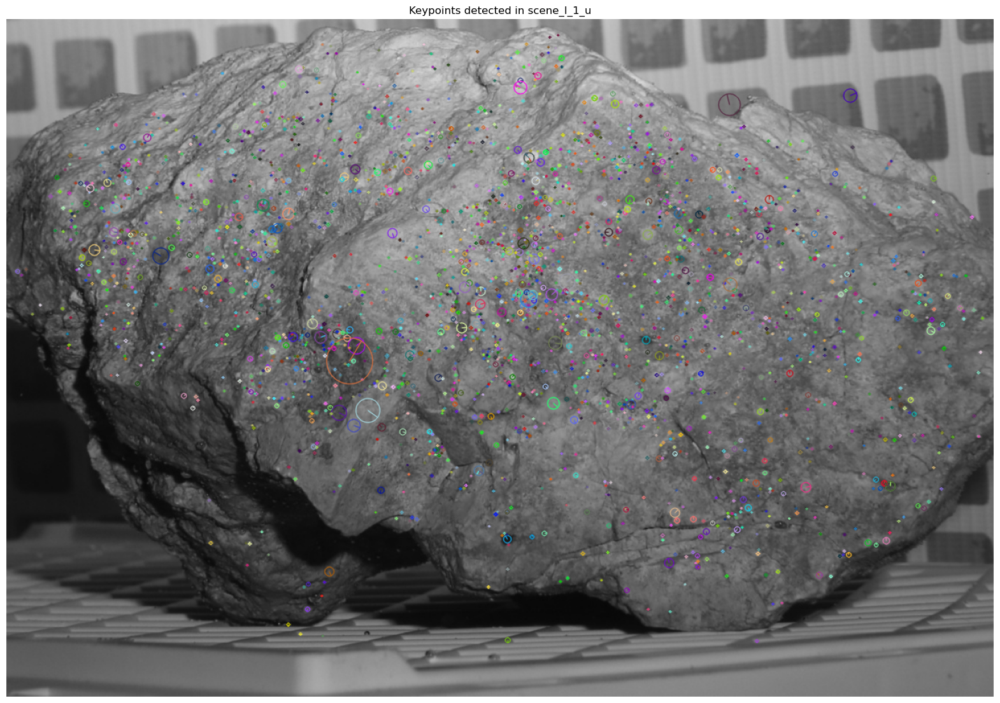

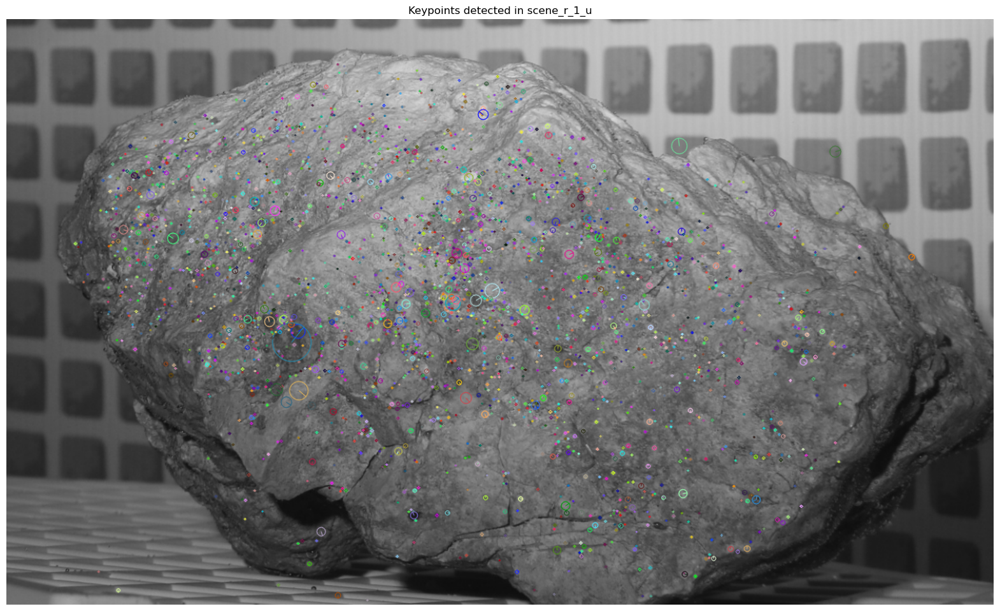

In [68]:
# %%script false
# show image 1 with keypoints
kp_img1_draw = cv.drawKeypoints(
    ims[0], kp_img1, None, flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS
)
plt.figure(figsize=(20, 20))
plt.imshow(kp_img1_draw)
plt.axis("off")
plt.title(f"Keypoints detected in {im_name1}")
# save figure
# plt.savefig(f"{img_folder}/cubes_sift_kp1.png", dpi=600)
plt.show()

# show image 2 with keypoints
kp_img2_draw = cv.drawKeypoints(
    ims[1], kp_img2, None, flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS
)
plt.figure(figsize=(20, 20))
plt.imshow(kp_img2_draw)
plt.axis("off")
plt.title(f"Keypoints detected in {im_name2}")
# save figure
# plt.savefig(f"{img_folder}/cubes_sift_kp2.png", dpi=600)
plt.show()

Show curvature values


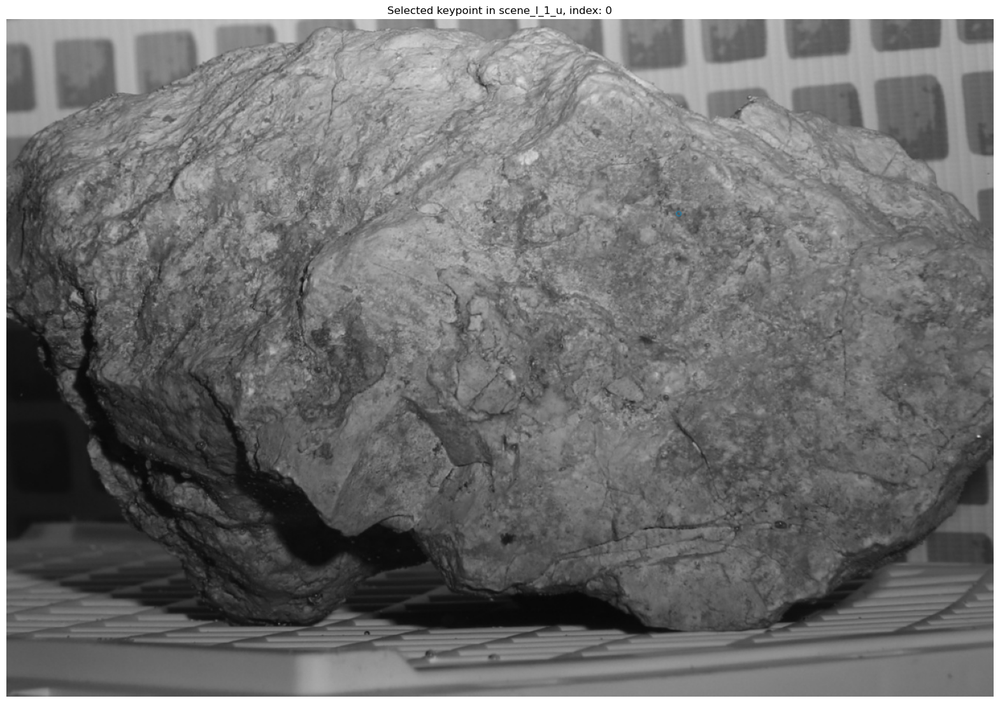

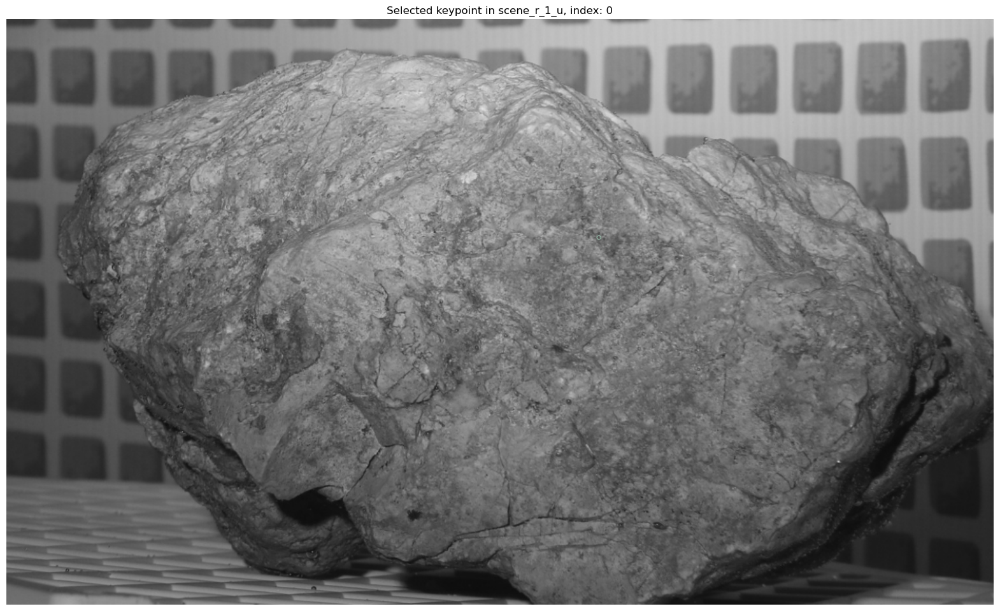

In [69]:
zoom_radius = 50
kp_index = 0
# kp_index = np.random.randint(0, len(kp_img1))
kp1 = kp_img1[kp_index]
kp2 = kp_img2[kp_index]
kps = [kp1, kp2]

# %%script false
# draw single keypoint on image 0
kp_img1_draw_single = cv.drawKeypoints(ims[0], [kp1], None, flags=None)
plt.figure(figsize=(20, 20))
plt.imshow(kp_img1_draw_single)
plt.axis("off")
plt.title(f"Selected keypoint in {im_name1}, index: {kp_index}")
# save figure
plt.show()

# draw single keypoint on image 1
kp_img2_draw_single = cv.drawKeypoints(ims[1], [kp2], None, flags=None)
plt.figure(figsize=(20, 20))
plt.imshow(kp_img2_draw_single)
plt.axis("off")
plt.title(f"Selected keypoint in {im_name2}, index: {kp_index}")
# save figure
plt.show()

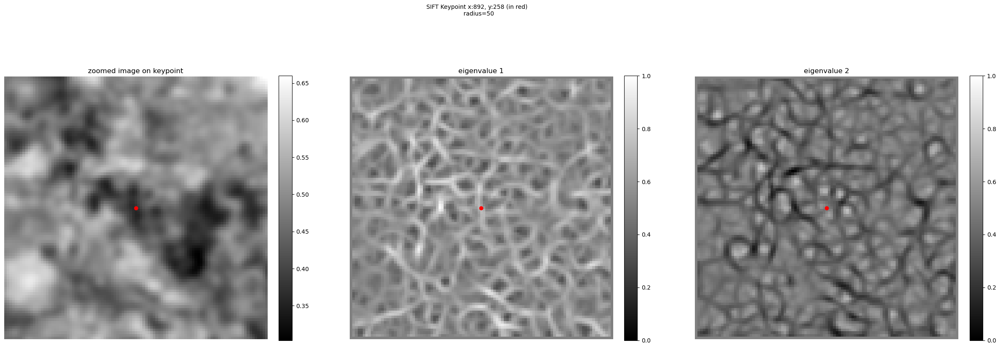

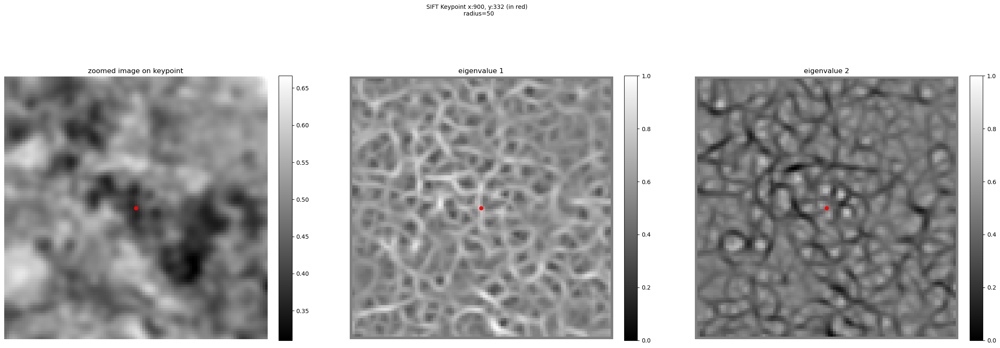

In [70]:
# %%script false
# display the figure of curvature values on the float versions
eigval_fig1 = vh.visualize_curvature_values(float_ims[0], kp1, zoom_radius)
plt.figure(eigval_fig1.number)
plt.show()

eigval_fig2 = vh.visualize_curvature_values(float_ims[1], kp2, zoom_radius)
plt.figure(eigval_fig2.number)
plt.show()

Display curvature directions side by side


In [71]:
# %%script false
dir_fig = vh.compare_directions(
    float_ims[0], float_ims[1], kp1, kp2, zoom_radius, dpi=800
)

# show figure
plt.figure(dir_fig.number)
plt.show()

Show gradients side by side²


In [72]:
# %%script false
grad_fig = vh.compare_gradients(
    float_ims[0], float_ims[1], kp1, kp2, zoom_radius, dpi=800
)

# show figure
plt.figure(grad_fig.number)
plt.show()

# Compute histograms descriptors of keypoints


In [73]:
kp_pos = []
for kp in (kp1, kp2):
    # convert into integer
    pos = np.round(kp.pt).astype(int)
    pos = tuple(pos)
    kp_pos.append(pos)


# define parameters for the descriptor
border_size = 1
feature_radius = zoom_radius + 20

# crop the subimages around keypoints
crop_ims = [
    vh.crop_image_around_keypoint(float_ims[i], kp_pos[i], feature_radius)
    for i in range(2)
]

# compute zoomed positions
zoomed_pos = [feature_radius, feature_radius]

Problem: neighborhood is fixed here by the frame of the image, and not is not an intrinsec feature of the keypoint orientation


## New feature: descriptor rotation with keypoint gradient orientation


In [74]:
# compute overall features of a subimage of first image
zoomed_features3 = [
    desc.compute_features_overall_abs(crop_ims[i], border_size) for i in range(2)
]

In [75]:
descriptor_histograms_kps3 = [
    desc.compute_descriptor_histograms_1_2_rotated(zoomed_features3[i], zoomed_pos)
    for i in range(2)
]

### Compare descriptors


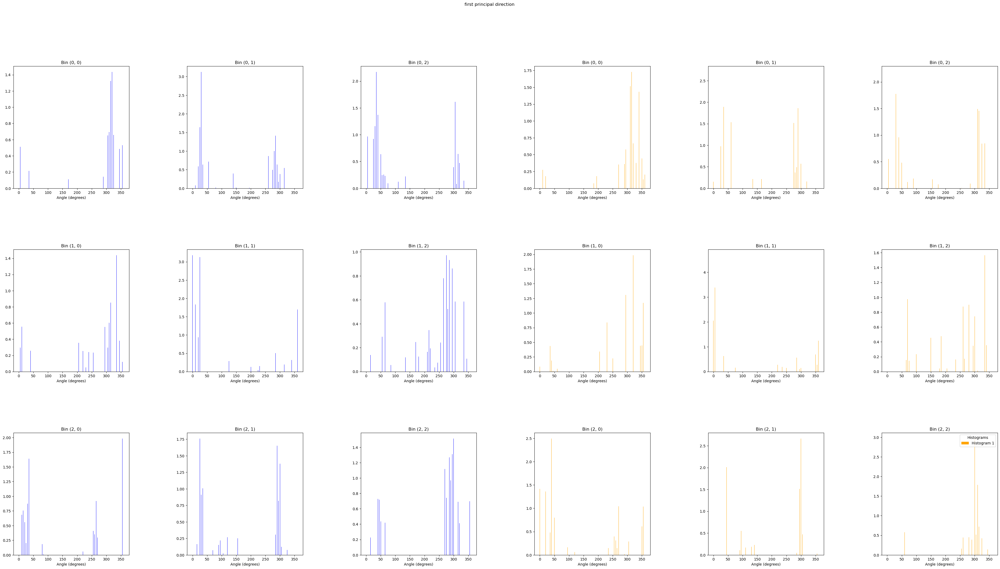

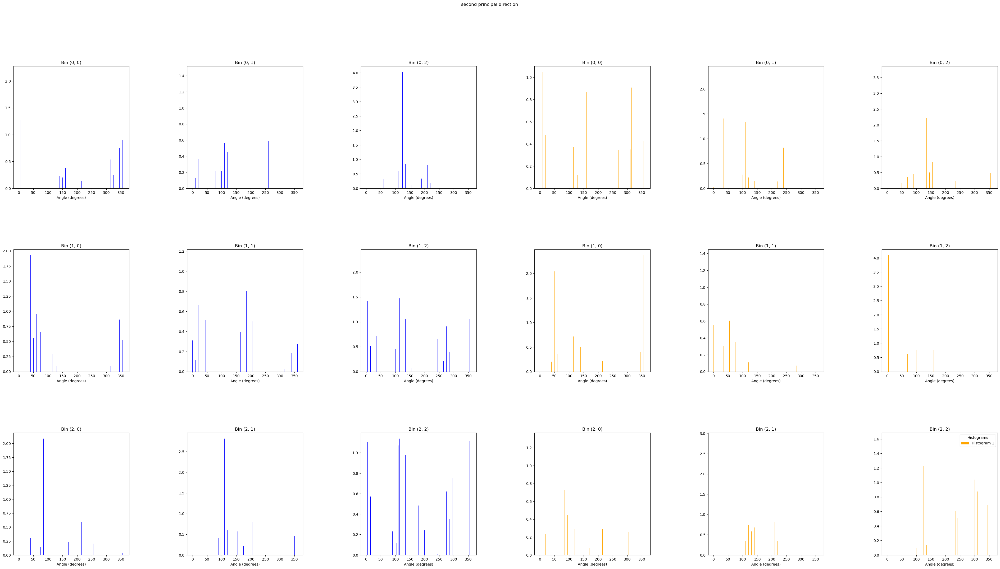

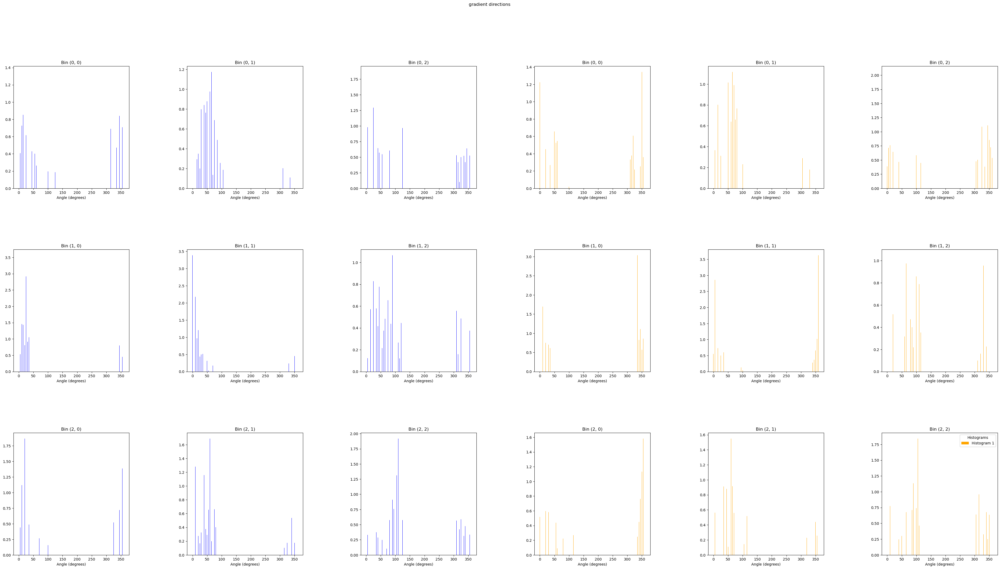

In [76]:
descriptor_names3 = [f"Descriptor 3 of {im_names[i]}" for i in range(2)]


values_names3 = [
    "first principal direction",
    "second principal direction",
    "gradient directions",
]

for id_feature in range(3):
    visu_desc.display_matched_histograms(
        hist1=descriptor_histograms_kps3[0][id_feature],
        hist2=descriptor_histograms_kps3[1][id_feature],
        hist_title=values_names3[id_feature],
    )

### Compute distance between descriptors


In [77]:
# %%script false

# flatten the descriptor histograms


flat_descriptor_histograms_kps3 = [
    desc.flatten_descriptor(descriptor_histograms_kps3[i]) for i in range(2)
]


# compute distance between descriptors


dist3 = desc.compute_descriptor_distance(
    flat_descriptor_histograms_kps3[0], flat_descriptor_histograms_kps3[1]
)

dist3

19.09473

Look at distance between the keypoint of the left image and neighbors of the keypoint of the right images


In [78]:
# %%script false
nb_neighbors = 10
# index of the image where neighbors are computed
im_index = 1
delta_pixel = 10


# generate nb_neighbors random coordinates shifts in 2D


neighbors_shifts3 = np.random.randint(
    -delta_pixel, delta_pixel + 1, size=(nb_neighbors, 2)
)


# compute the neighbor positions


neighbors_positions3 = np.array(kp_pos[im_index]) + neighbors_shifts3


# crop the subimages around neighbors


neighbors_crop_ims3 = [
    vh.crop_image_around_keypoint(
        float_ims[im_index], neighbors_positions3[i], feature_radius
    )
    for i in range(nb_neighbors)
]


# compute overall features of a subimage of second image around the neighbors


neighbors_zoomed_features3 = [
    desc.compute_features_overall_abs(neighbors_crop_ims3[i], border_size)
    for i in range(nb_neighbors)
]


# compute descriptor histograms of the neighbors


neighbors_descriptor_histograms_kps3 = [
    desc.compute_descriptor_histograms_1_2_rotated(
        neighbors_zoomed_features3[i], zoomed_pos
    )
    for i in range(nb_neighbors)
]


# flatten the descriptor histograms


neighbors_flat_descriptor_histograms_kps3 = [
    desc.flatten_descriptor(neighbors_descriptor_histograms_kps3[i])
    for i in range(nb_neighbors)
]


# compute distances between descriptors


neighbors_dists3 = [
    desc.compute_descriptor_distance(
        flat_descriptor_histograms_kps3[0], neighbors_flat_descriptor_histograms_kps3[i]
    )
    for i in range(nb_neighbors)
]

In [79]:
# print the distances


for i, dist in enumerate(neighbors_dists3):
    print(f"Distance with neighbor {i+1}: {dist:.2f}")

Distance with neighbor 1: 23.14
Distance with neighbor 2: 25.58
Distance with neighbor 3: 24.23
Distance with neighbor 4: 26.20
Distance with neighbor 5: 24.69
Distance with neighbor 6: 24.65
Distance with neighbor 7: 24.14
Distance with neighbor 8: 26.07
Distance with neighbor 9: 24.14
Distance with neighbor 10: 25.69
